# Agent Metrics Analysis

This notebook processes and visualizes agent metrics from the monitor.csv file.

In [17]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import json
import os
import numpy as np
from matplotlib import pyplot as plt 
import numpy as np
from scipy import stats as sci_stats


In [4]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA

In [5]:
def transform_csv(input_file, output_file):
    # Read the CSV file
    df = pd.read_csv(input_file, comment='#', skipinitialspace=True)

    # Function to extract agent and value
    def extract_agent_value(s):
        parts = s.split('_')
        return f'pursuer_{parts[1]}', float(parts[2])

    # Apply the extraction to each column
    df['arousal_agent'], df['arousal_value'] = zip(*df['arousal'].apply(extract_agent_value))
    df['satiety_agent'], df['satiety_value'] = zip(*df['satiety'].apply(extract_agent_value))
    df['social_touch_agent'], df['social_touch_value'] = zip(*df['social-touch'].apply(extract_agent_value))

    # Reshape the dataframe
    result = pd.DataFrame({
        'agent': df['arousal_agent'],
        'r': df['r'],
        'l': df['l'],
        't': df['t'],
        'arousal': df['arousal_value'],
        'satiety': df['satiety_value'],
        'social_touch': df['social_touch_value']
    })

    # Sort the dataframe by agent and time
    result = result.sort_values(['agent', 't'])

    # Normalize arousal and satiety
    for agent in result['agent'].unique():
        mask = result['agent'] == agent
        result.loc[mask, 'arousal_norm'] = (result.loc[mask, 'arousal'] - result.loc[mask, 'arousal'].mean()) / result.loc[mask, 'arousal'].std()
        result.loc[mask, 'satiety_norm'] = (result.loc[mask, 'satiety'] - result.loc[mask, 'satiety'].mean()) / result.loc[mask, 'satiety'].std()

    # Save the result to a new CSV file
    result.to_csv(output_file, index=False)

    print(f"Transformed data saved to {output_file}")
    return result

In [6]:
def calculate_rolling_stats(df, window_size):
    stats = []
    df = df.rename(columns={'r': 'rewards'})

    for agent in df['agent'].unique():
        agent_data = df[df['agent'] == agent]
        rolling_data = pd.DataFrame({
            'arousal_mean': agent_data['arousal'].rolling(window=window_size).mean(),
            'arousal_std': agent_data['arousal'].rolling(window=window_size).std(),
            'satiety_mean': agent_data['satiety'].rolling(window=window_size).mean(),
            'satiety_std': agent_data['satiety'].rolling(window=window_size).std(),
            'arousal_norm_mean': agent_data['arousal_norm'].rolling(window=window_size).mean(),
            'arousal_norm_std': agent_data['arousal_norm'].rolling(window=window_size).std(),
            'satiety_norm_mean': agent_data['satiety_norm'].rolling(window=window_size).mean(),
            'satiety_norm_std': agent_data['satiety_norm'].rolling(window=window_size).std(),
            'social_touch_count': agent_data['social_touch'].rolling(window=window_size).apply(lambda x: (x > 0).sum()),
            'rewards_mean': agent_data['rewards'].rolling(window=window_size).mean(),
            'rewards_std': agent_data['rewards'].rolling(window=window_size).std(),
            'cumulative_rewards': agent_data['rewards'].cumsum(),
            't': agent_data['t'],
        })

        # Drop rows with NaN values
        rolling_data_cleaned = rolling_data.dropna()

        # Append the cleaned data to stats
        stats.append({
            'agent': agent,
            'arousal_mean': rolling_data_cleaned['arousal_mean'],
            'arousal_std': rolling_data_cleaned['arousal_std'],
            'satiety_mean': rolling_data_cleaned['satiety_mean'],
            'satiety_std': rolling_data_cleaned['satiety_std'],
            'arousal_norm_mean': rolling_data_cleaned['arousal_norm_mean'],
            'arousal_norm_std': rolling_data_cleaned['arousal_norm_std'],
            'satiety_norm_mean': rolling_data_cleaned['satiety_norm_mean'],
            'satiety_norm_std': rolling_data_cleaned['satiety_norm_std'],
            'social_touch_count': rolling_data_cleaned['social_touch_count'],
            'rewards_mean': rolling_data_cleaned['rewards_mean'],
            'rewards_std': rolling_data_cleaned['rewards_std'],
            'cumulative_rewards': rolling_data_cleaned['cumulative_rewards'],
            't': rolling_data_cleaned['t']
        })
    return stats

In [7]:
def plot_metrics(df, stats):
    # Create figures for raw and normalized data
    fig_raw = make_subplots(rows=3, cols=1, subplot_titles=('Arousal Over Time', 'Satiety Over Time', 'Social Touch Events Over Time'))
    fig_norm = make_subplots(rows=3, cols=1, subplot_titles=('Normalized Arousal Over Time', 'Normalized Satiety Over Time', 'Social Touch Events Over Time'))

    # Colors for each agent
    colors = {'pursuer_0': 'blue', 'pursuer_1': 'red'}

    # Plot raw and normalized data
    for agent in df['agent'].unique():
        agent_data = df[df['agent'] == agent]
        
        # Raw data
        fig_raw.add_trace(go.Scatter(x=agent_data['t'], y=agent_data['arousal'], mode='lines', name=f'{agent} Arousal', line=dict(color=colors[agent])), row=1, col=1)
        fig_raw.add_trace(go.Scatter(x=agent_data['t'], y=agent_data['satiety'], mode='lines', name=f'{agent} Satiety', line=dict(color=colors[agent])), row=2, col=1)
        
        # Normalized data
        fig_norm.add_trace(go.Scatter(x=agent_data['t'], y=agent_data['arousal_norm'], mode='lines', name=f'{agent} Arousal', line=dict(color=colors[agent])), row=1, col=1)
        fig_norm.add_trace(go.Scatter(x=agent_data['t'], y=agent_data['satiety_norm'], mode='lines', name=f'{agent} Satiety', line=dict(color=colors[agent])), row=2, col=1)

    # Plot social touch event counts (same for both raw and normalized)
    for stat in stats:
        fig_raw.add_trace(go.Scatter(x=stat['t'], y=stat['social_touch_count'], mode='lines', name=f"{stat['agent']} Social Touch Events", line=dict(color=colors[stat['agent']])), row=3, col=1)
        fig_norm.add_trace(go.Scatter(x=stat['t'], y=stat['social_touch_count'], mode='lines', name=f"{stat['agent']} Social Touch Events", line=dict(color=colors[stat['agent']])), row=3, col=1)

    # Add rolling mean to raw and normalized plots
    for stat in stats:
        fig_raw.add_trace(go.Scatter(x=stat['t'], y=stat['arousal_mean'], mode='lines', name=f"{stat['agent']} Arousal Mean", line=dict(dash='dash', color=colors[stat['agent']])), row=1, col=1)
        fig_raw.add_trace(go.Scatter(x=stat['t'], y=stat['satiety_mean'], mode='lines', name=f"{stat['agent']} Satiety Mean", line=dict(dash='dash', color=colors[stat['agent']])), row=2, col=1)
        
        fig_norm.add_trace(go.Scatter(x=stat['t'], y=stat['arousal_norm_mean'], mode='lines', name=f"{stat['agent']} Arousal Mean", line=dict(dash='dash', color=colors[stat['agent']])), row=1, col=1)
        fig_norm.add_trace(go.Scatter(x=stat['t'], y=stat['satiety_norm_mean'], mode='lines', name=f"{stat['agent']} Satiety Mean", line=dict(dash='dash', color=colors[stat['agent']])), row=2, col=1)

    # Update layout for both figures
    for fig, title in [(fig_raw, "Raw Agent Metrics Over Time"), (fig_norm, "Normalized Agent Metrics Over Time")]:
        fig.update_layout(height=900, width=1000, title_text=title)
        fig.update_xaxes(title_text="Time", row=3, col=1)
        fig.update_yaxes(title_text="Arousal" if "Raw" in title else "Normalized Arousal", row=1, col=1)
        fig.update_yaxes(title_text="Satiety" if "Raw" in title else "Normalized Satiety", row=2, col=1)
        fig.update_yaxes(title_text="Social Touch Event Count", row=3, col=1)

    return fig_raw, fig_norm

## Set the log directory and process the data

In [8]:
# Set your log directory here
log_dir = "./logs/average_pettingzoo.sisl.waterworld_model1_20240819-135152"

input_file = os.path.join(log_dir, 'monitor.csv')
transformed_file = os.path.join(log_dir, 'transformed_monitor.csv')

# Check if input file exists
if not os.path.exists(input_file):
    print(f"Error: {input_file} not found.")
else:
    # Always transform the CSV to ensure we have the latest version with normalized columns
    df = transform_csv(input_file, transformed_file)

    # Calculate the window size for rolling statistics
    total_time_points = len(df['t'].unique())
    window_size = max(1, total_time_points // 100)  # Ensure at least 1

    # Calculate rolling statistics
    stats = calculate_rolling_stats(df, window_size)

    print("Data processing completed.")

Transformed data saved to ./logs/average_pettingzoo.sisl.waterworld_model1_20240819-135152/transformed_monitor.csv
Data processing completed.


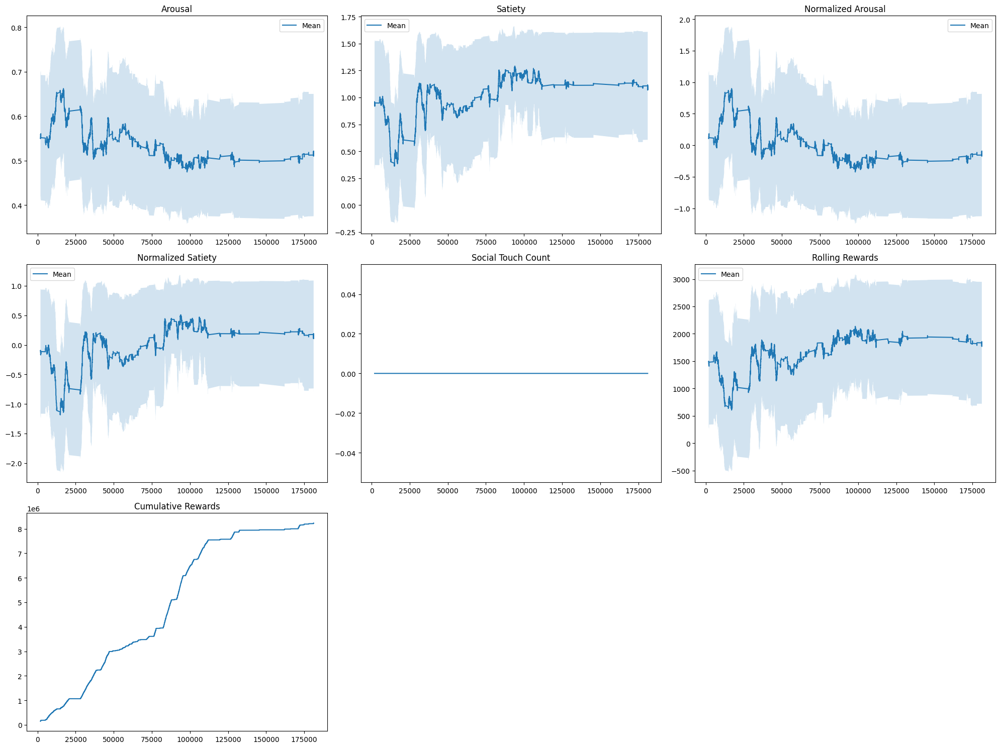

<Figure size 640x480 with 0 Axes>

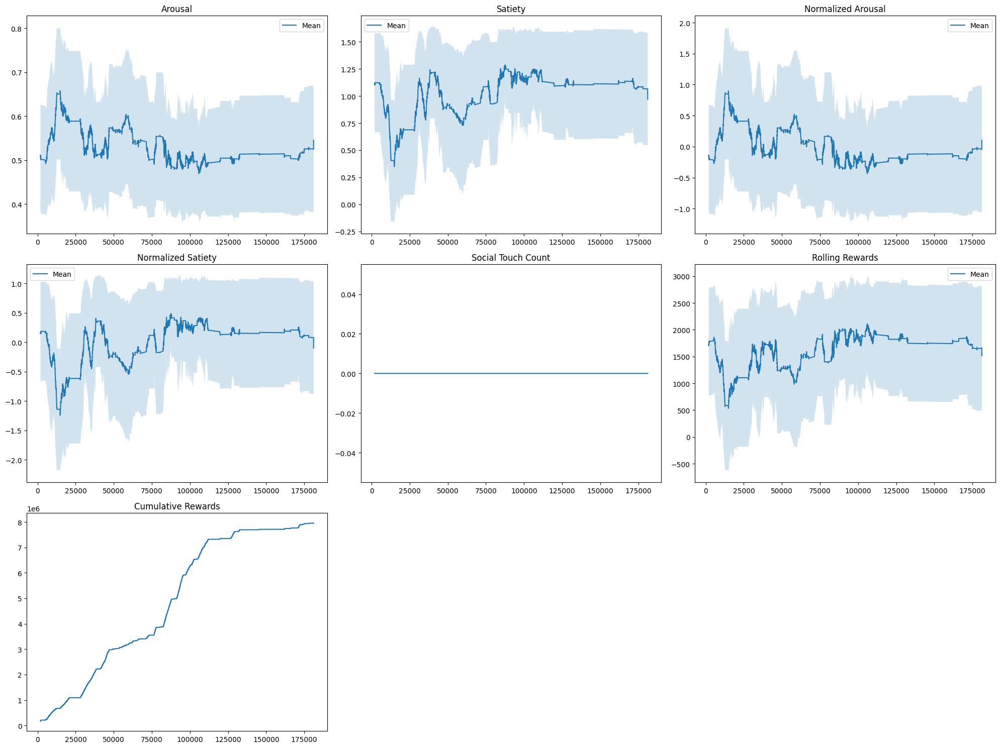

<Figure size 640x480 with 0 Axes>

In [97]:
def plot_agent_metrics(agent_data):
    plt.figure(figsize=(20, 15))
    
    # Plot arousal
    plt.subplot(3, 3, 1)
    plt.plot(agent_data['t'], agent_data['arousal_mean'], label='Mean')
    plt.fill_between(agent_data['t'], 
                     agent_data['arousal_mean'] - agent_data['arousal_std'],
                     agent_data['arousal_mean'] + agent_data['arousal_std'],
                     alpha=0.2)
    plt.title('Arousal')
    plt.legend()
    
    # Plot satiety
    plt.subplot(3, 3, 2)
    plt.plot(agent_data['t'], agent_data['satiety_mean'], label='Mean')
    plt.fill_between(agent_data['t'], 
                     agent_data['satiety_mean'] - agent_data['satiety_std'],
                     agent_data['satiety_mean'] + agent_data['satiety_std'],
                     alpha=0.2)
    plt.title('Satiety')
    plt.legend()
    
    # Plot normalized arousal
    plt.subplot(3, 3, 3)
    plt.plot(agent_data['t'], agent_data['arousal_norm_mean'], label='Mean')
    plt.fill_between(agent_data['t'], 
                     agent_data['arousal_norm_mean'] - agent_data['arousal_norm_std'],
                     agent_data['arousal_norm_mean'] + agent_data['arousal_norm_std'],
                     alpha=0.2)
    plt.title('Normalized Arousal')
    plt.legend()
    
    # Plot normalized satiety
    plt.subplot(3, 3, 4)
    plt.plot(agent_data['t'], agent_data['satiety_norm_mean'], label='Mean')
    plt.fill_between(agent_data['t'], 
                     agent_data['satiety_norm_mean'] - agent_data['satiety_norm_std'],
                     agent_data['satiety_norm_mean'] + agent_data['satiety_norm_std'],
                     alpha=0.2)
    plt.title('Normalized Satiety')
    plt.legend()
    
    # Plot social touch count
    plt.subplot(3, 3, 5)
    plt.plot(agent_data['t'], agent_data['social_touch_count'])
    plt.title('Social Touch Count')
    
    # Plot rolling rewards
    plt.subplot(3, 3, 6)
    plt.plot(agent_data['t'], agent_data['rewards_mean'], label='Mean')
    plt.fill_between(agent_data['t'], 
                     agent_data['rewards_mean'] - agent_data['rewards_std'],
                     agent_data['rewards_mean'] + agent_data['rewards_std'],
                     alpha=0.2)
    plt.title('Rolling Rewards')
    plt.legend()
    
    # Plot cumulative rewards
    plt.subplot(3, 3, 7)
    plt.plot(agent_data['t'], agent_data['cumulative_rewards'])
    plt.title('Cumulative Rewards')
    
    plt.tight_layout()
    plt.savefig(f"{log_dir}/training_metrics_progression_{agent_data['agent']}.png")

    plt.show()
# Example usage:
stats_no_effect = calculate_rolling_stats(df_no_effect, window_size)
for agent_stats in stats_no_effect:
    plot_agent_metrics(agent_stats)
    plt.suptitle(f"Metrics for Agent: {agent_stats['agent']}", fontsize=16)
    plt.show()

In [86]:
for agent_stats in stats:
    plt.suptitle(f"Metrics for Agent: {agent_stats['agent']}", fontsize=16)
    print("beginning arousal state: " + str(agent_stats['arousal_mean'].reset_index(drop=True)[0]) + " , ending arousal state: "  + str(agent_stats['arousal_mean'].reset_index(drop=True)[-1:]))
    print("beginning satiety state: " + str(agent_stats['satiety_mean'].reset_index(drop=True)[0]) + " , ending satiety state: "  + str(agent_stats['satiety_mean'].reset_index(drop=True)[-1:]))

beginning arousal state: 0.5728039732765159 , ending arousal state: 4916    0.521934
Name: arousal_mean, dtype: float64
beginning satiety state: 0.8735398053731085 , ending satiety state: 4916    1.094191
Name: satiety_mean, dtype: float64
beginning arousal state: 0.5682243045573532 , ending arousal state: 4916    0.523467
Name: arousal_mean, dtype: float64
beginning satiety state: 0.8878765487899196 , ending satiety state: 4916    1.029956
Name: satiety_mean, dtype: float64


<Figure size 640x480 with 0 Axes>

## Plot the metrics

In [78]:
fig_raw, fig_norm = plot_metrics(df, stats)
fig_raw.show()

In [79]:
fig_norm.show()

In [9]:
# Set your log directory here
log_dir = "./logs/no_effect_pettingzoo.sisl.waterworld_model1_20240820-115235"

input_file = os.path.join(log_dir, 'monitor.csv')
transformed_file = os.path.join(log_dir, 'transformed_monitor.csv')

# Check if input file exists
if not os.path.exists(input_file):
    print(f"Error: {input_file} not found.")
else:
    # Always transform the CSV to ensure we have the latest version with normalized columns
    df_no_effect = transform_csv(input_file, transformed_file)

    # Calculate the window size for rolling statistics
    total_time_points_no_effect = len(df['t'].unique())
    window_size = max(1, total_time_points_no_effect // 100)  # Ensure at least 1

    # Calculate rolling statistics
    stats_no_effect = calculate_rolling_stats(df_no_effect, window_size)

    print("Data processing completed.")

Transformed data saved to ./logs/no_effect_pettingzoo.sisl.waterworld_model1_20240820-115235/transformed_monitor.csv
Data processing completed.


## Print simple metrics

In [12]:
print("\nSimple Metrics for system with haptic modulation:")
for agent in df['agent'].unique():
    agent_data = df[df['agent'] == agent]
    print(f"\n{agent.capitalize()}:")
    print(f"Arousal - Median: {agent_data['arousal'].median():.4f}, Std Dev: {agent_data['arousal'].std():.4f}")
    print(f"Satiety - Median: {agent_data['satiety'].median():.4f}, Std Dev: {agent_data['satiety'].std():.4f}")
    print(f"Normalized Arousal - Median: {agent_data['arousal_norm'].median():.4f}, Std Dev: {agent_data['arousal_norm'].std():.4f}")
    print(f"Normalized Satiety - Median: {agent_data['satiety_norm'].median():.4}")

print("\nSimple Metrics for system with no haptic modulation:")
for agent in df_no_effect['agent'].unique():
    agent_data = df_no_effect[df_no_effect['agent'] == agent]
    print(f"\n{agent.capitalize()}:")
    print(f"Arousal - Median: {agent_data['arousal'].median():.4f}, Std Dev: {agent_data['arousal'].std():.4f}")
    print(f"Satiety - Median: {agent_data['satiety'].median():.4f}, Std Dev: {agent_data['satiety'].std():.4f}")
    print(f"Normalized Arousal - Median: {agent_data['arousal_norm'].median():.4f}, Std Dev: {agent_data['arousal_norm'].std():.4f}")
    print(f"Normalized Satiety - Median: {agent_data['satiety_norm'].median():.4}")



Simple Metrics for system with haptic modulation:

Pursuer_0:
Arousal - Median: 0.5026, Std Dev: 0.1285
Satiety - Median: 1.2547, Std Dev: 0.5463
Normalized Arousal - Median: -0.2832, Std Dev: 1.0000
Normalized Satiety - Median: 0.4258

Pursuer_1:
Arousal - Median: 0.4860, Std Dev: 0.1381
Satiety - Median: 1.2581, Std Dev: 0.5349
Normalized Arousal - Median: -0.3620, Std Dev: 1.0000
Normalized Satiety - Median: 0.4098

Simple Metrics for system with no haptic modulation:

Pursuer_0:
Arousal - Median: 0.4776, Std Dev: 0.1417
Satiety - Median: 1.2426, Std Dev: 0.5485
Normalized Arousal - Median: -0.4018, Std Dev: 1.0000
Normalized Satiety - Median: 0.422

Pursuer_1:
Arousal - Median: 0.4738, Std Dev: 0.1410
Satiety - Median: 1.2491, Std Dev: 0.5429
Normalized Arousal - Median: -0.4039, Std Dev: 1.0000
Normalized Satiety - Median: 0.417


CHECK IF BETWEEN THE TWO, IF THERE IS SIGNIFICANT DIFFERENCE 


In [21]:


def compare_time_series(series1, series2, metric_name):
    print(f"Comparing {metric_name}:")
    
    # 1. Augmented Dickey-Fuller test for stationarity
    result1 = adfuller(series1)
    result2 = adfuller(series2)
    print(f"ADF Statistic for series 1: {result1[0]}, p-value: {result1[1]}")
    print(f"ADF Statistic for series 2: {result2[0]}, p-value: {result2[1]}")
    
    # 2. Kolmogorov-Smirnov test
    ks_statistic, p_value = sci_stats.ks_2samp(series1, series2)
    print(f"Kolmogorov-Smirnov test: statistic = {ks_statistic}, p-value = {p_value}")
    
    # 3. Mann-Whitney U test
    statistic, p_value = sci_stats.mannwhitneyu(series1, series2)
    print(f"Mann-Whitney U test: statistic = {statistic}, p-value = {p_value}")
    
    # 4. ARIMA model comparison (example with order (1,0,0))
    model1 = ARIMA(series1, order=(1,0,0))
    model2 = ARIMA(series2, order=(1,0,0))
    results1 = model1.fit()
    results2 = model2.fit()
    print(f"ARIMA AIC for series 1: {results1.aic}")
    print(f"ARIMA AIC for series 2: {results2.aic}")
    
    print("\n")

for agent in df['agent'].unique():
    agent_data_no_effect = df_no_effect[df_no_effect['agent'] == agent]
    agent_data = df[df['agent'] == agent]
    compare_time_series(agent_data_no_effect['arousal'].reset_index(drop=True), agent_data['arousal'].reset_index(drop=True), f"{agent} Arousal")
    compare_time_series(agent_data_no_effect['satiety'].reset_index(drop=True), agent_data['satiety'].reset_index(drop=True), f"{agent} Satiety")

print("Sanity check to between agents within condition")
print("Haptic arousal modulation")
compare_time_series(df[df['agent'] == "pursuer_0"]['arousal'].reset_index(drop=True), df[df['agent'] == "pursuer_1"]['arousal'].reset_index(drop=True), f"{agent} Arousal")
compare_time_series(df[df['agent'] == "pursuer_0"]['satiety'].reset_index(drop=True), df[df['agent'] == "pursuer_1"]['satiety'].reset_index(drop=True), f"{agent} Satiety")
print("No haptic arousal modulation")
compare_time_series(df_no_effect[df_no_effect['agent'] == "pursuer_0"]['arousal'].reset_index(drop=True), df_no_effect[df_no_effect['agent'] == "pursuer_1"]['arousal'].reset_index(drop=True), f"{agent} Arousal")
compare_time_series(df_no_effect[df_no_effect['agent'] == "pursuer_0"]['satiety'].reset_index(drop=True), df_no_effect[df_no_effect['agent'] == "pursuer_1"]['satiety'].reset_index(drop=True), f"{agent} Satiety")



Comparing pursuer_0 Arousal:
ADF Statistic for series 1: -5.933179315127156, p-value: 2.3542079029029779e-07
ADF Statistic for series 2: -11.896689031640253, p-value: 5.700251079678959e-22
Kolmogorov-Smirnov test: statistic = 0.09529505582137161, p-value = 3.093116312581622e-20
Mann-Whitney U test: statistic = 11995406.0, p-value = 5.2767130863175905e-05
ARIMA AIC for series 1: -5397.865346193597
ARIMA AIC for series 2: -6353.634487118976


Comparing pursuer_0 Satiety:
ADF Statistic for series 1: -4.792726974060948, p-value: 5.615528610783324e-05
ADF Statistic for series 2: -8.014914990721728, p-value: 2.1517474991229795e-12
Kolmogorov-Smirnov test: statistic = 0.029106858054226477, p-value = 0.028534726024164375
Mann-Whitney U test: statistic = 12311640.0, p-value = 0.06288578061272734
ARIMA AIC for series 1: 8102.441277215195
ARIMA AIC for series 2: 8163.668006283261


Comparing pursuer_1 Arousal:
ADF Statistic for series 1: -6.387839610980567, p-value: 2.142222953602082e-08
ADF Stat

/Users/idil/anaconda3/envs/pettingzoo-sb3/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ARIMA AIC for series 1: -5432.966011620841
ARIMA AIC for series 2: -5626.634081288095


Comparing pursuer_1 Satiety:
ADF Statistic for series 1: -4.8381265227662364, p-value: 4.595214507350123e-05
ADF Statistic for series 2: -7.356955054391027, p-value: 9.723719927116923e-11
Kolmogorov-Smirnov test: statistic = 0.030502392344497607, p-value = 0.018798499438558006
Mann-Whitney U test: statistic = 12346782.5, p-value = 0.10612614366811342
ARIMA AIC for series 1: 8033.706060280262
ARIMA AIC for series 2: 7952.490787072436


Sanity check to between agents within condition
Haptic arousal modulation
Comparing pursuer_1 Arousal:
ADF Statistic for series 1: -11.896689031640253, p-value: 5.700251079678959e-22
ADF Statistic for series 2: -12.20189871346659, p-value: 1.2178504624319473e-22
Kolmogorov-Smirnov test: statistic = 0.06279904306220095, p-value = 5.071655431192136e-09
Mann-Whitney U test: statistic = 12969352.0, p-value = 0.007141560479595731


/Users/idil/anaconda3/envs/pettingzoo-sb3/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ARIMA AIC for series 1: -6353.634487118976
ARIMA AIC for series 2: -5626.634081288095


Comparing pursuer_1 Satiety:
ADF Statistic for series 1: -8.014914990721728, p-value: 2.1517474991229795e-12
ADF Statistic for series 2: -7.356955054391027, p-value: 9.723719927116923e-11
Kolmogorov-Smirnov test: statistic = 0.02531897926634769, p-value = 0.08026267389733541
Mann-Whitney U test: statistic = 12439765.0, p-value = 0.33113665023539396
ARIMA AIC for series 1: 8163.668006283261
ARIMA AIC for series 2: 7952.490787072436


No haptic arousal modulation
Comparing pursuer_1 Arousal:
ADF Statistic for series 1: -5.933179315127156, p-value: 2.3542079029029779e-07
ADF Statistic for series 2: -6.387839610980567, p-value: 2.142222953602082e-08
Kolmogorov-Smirnov test: statistic = 0.018341307814992026, p-value = 0.3676866937919085
Mann-Whitney U test: statistic = 12789903.0, p-value = 0.14607898238582978
ARIMA AIC for series 1: -5397.865346193597
ARIMA AIC for series 2: -5432.966011620841


Compari

Compare between rolling stats, is there more stability in satiety and arousal at the end of the training compared to beginning, between conditions

Stability Comparison:
Haptic Model:
  arousal_start_mean: 0.5721
  arousal_start_std: 0.1392
  arousal_end_mean: 0.5237
  arousal_end_std: 0.1296
  satiety_start_mean: 0.8790
  satiety_start_std: 0.5918
  satiety_end_mean: 1.0629
  satiety_end_std: 0.5169

No Haptic Model:
  arousal_start_mean: 0.5301
  arousal_start_std: 0.1338
  arousal_end_mean: 0.5300
  arousal_end_std: 0.1458
  satiety_start_mean: 1.0302
  satiety_start_std: 0.5257
  satiety_end_mean: 1.0346
  satiety_end_std: 0.5422



Plot saved as 'stability_efficiency_comparison.png'

Difference in Stability Metrics (Haptic - No Haptic):
  arousal_start_mean: 0.0420
  arousal_start_std: 0.0054
  arousal_end_mean: -0.0063
  arousal_end_std: -0.0162
  satiety_start_mean: -0.1512
  satiety_start_std: 0.0661
  satiety_end_mean: 0.0284
  satiety_end_std: -0.0252


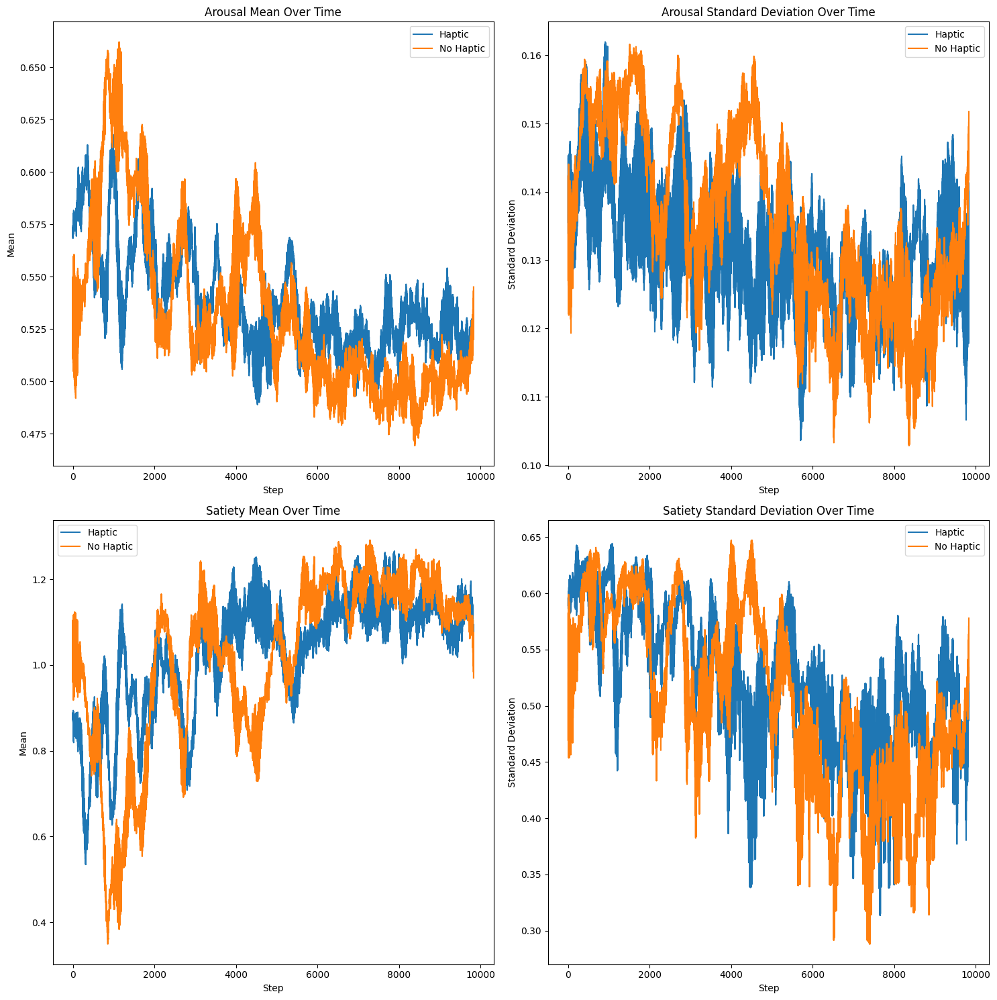

In [56]:

def compare_stability_and_efficiency(stats_haptic, stats_no_haptic, window_size=10):
    """
    Compare stability and efficiency between two models using arousal and satiety data.
    
    :param stats_haptic: List of dictionaries with stats for the haptic model
    :param stats_no_haptic: List of dictionaries with stats for the no-haptic model
    :param window_size: Size of the window for start and end comparison
    """
    
    def process_stats(stats):
        # Combine all agents' data
        combined_stats = pd.DataFrame()
        for agent_stats in stats:
            agent_df = pd.DataFrame(agent_stats)
            combined_stats = pd.concat([combined_stats, agent_df])
        
        # Sort by the original order (assuming it's already time-ordered) and reset index
        combined_stats = combined_stats.sort_index().reset_index(drop=True)
        
        # Calculate start and end windows
        start_window = combined_stats.head(window_size)
        end_window = combined_stats.tail(window_size)
        
        # Calculate stability metrics
        stability = {
            'arousal_start_mean': start_window['arousal_mean'].mean(),
            'arousal_start_std': start_window['arousal_std'].mean(),
            'arousal_end_mean': end_window['arousal_mean'].mean(),
            'arousal_end_std': end_window['arousal_std'].mean(),
            'satiety_start_mean': start_window['satiety_mean'].mean(),
            'satiety_start_std': start_window['satiety_std'].mean(),
            'satiety_end_mean': end_window['satiety_mean'].mean(),
            'satiety_end_std': end_window['satiety_std'].mean(),
        }
        
        return combined_stats, stability
    
    stats_haptic_combined, stability_haptic = process_stats(stats_haptic)
    stats_no_haptic_combined, stability_no_haptic = process_stats(stats_no_haptic)
    
    # Print stability comparison
    print("Stability Comparison:")
    print("Haptic Model:")
    for key, value in stability_haptic.items():
        print(f"  {key}: {value:.4f}")
    print("\nNo Haptic Model:")
    for key, value in stability_no_haptic.items():
        print(f"  {key}: {value:.4f}")
    
    # Plot mean and std over time
    fig, axs = plt.subplots(2, 2, figsize=(15, 15))
    metrics = ['arousal', 'satiety']
    
    for i, metric in enumerate(metrics):
        # Plot mean
        axs[i, 0].plot(stats_haptic_combined.index, stats_haptic_combined[f'{metric}_mean'], label='Haptic')
        axs[i, 0].plot(stats_no_haptic_combined.index, stats_no_haptic_combined[f'{metric}_mean'], label='No Haptic')
        axs[i, 0].set_title(f'{metric.capitalize()} Mean Over Time')
        axs[i, 0].set_xlabel('Step')
        axs[i, 0].set_ylabel('Mean')
        axs[i, 0].legend()
        
        # Plot std
        axs[i, 1].plot(stats_haptic_combined.index, stats_haptic_combined[f'{metric}_std'], label='Haptic')
        axs[i, 1].plot(stats_no_haptic_combined.index, stats_no_haptic_combined[f'{metric}_std'], label='No Haptic')
        axs[i, 1].set_title(f'{metric.capitalize()} Standard Deviation Over Time')
        axs[i, 1].set_xlabel('Step')
        axs[i, 1].set_ylabel('Standard Deviation')
        axs[i, 1].legend()
    
    plt.tight_layout()
    plt.savefig('stability_efficiency_comparison.png')

    
    print("\nPlot saved as 'stability_efficiency_comparison.png'")

    # Additional analysis: Compute and print the difference in stability metrics
    print("\nDifference in Stability Metrics (Haptic - No Haptic):")
    for key in stability_haptic.keys():
        diff = stability_haptic[key] - stability_no_haptic[key]
        print(f"  {key}: {diff:.4f}")

compare_stability_and_efficiency(stats, stats_no_effect)

In [39]:
df_no_effect['t']

0           148.007042
2           148.007488
4           148.007559
6           148.007621
8           148.007681
             ...      
10023    181168.703406
10025    181168.703505
10027    181168.703605
10029    181168.703704
10031    181168.703800
Name: t, Length: 10032, dtype: float64

Plot saved to ./cumulative_rewards_comparison.png
p-value of difference: 0.6064


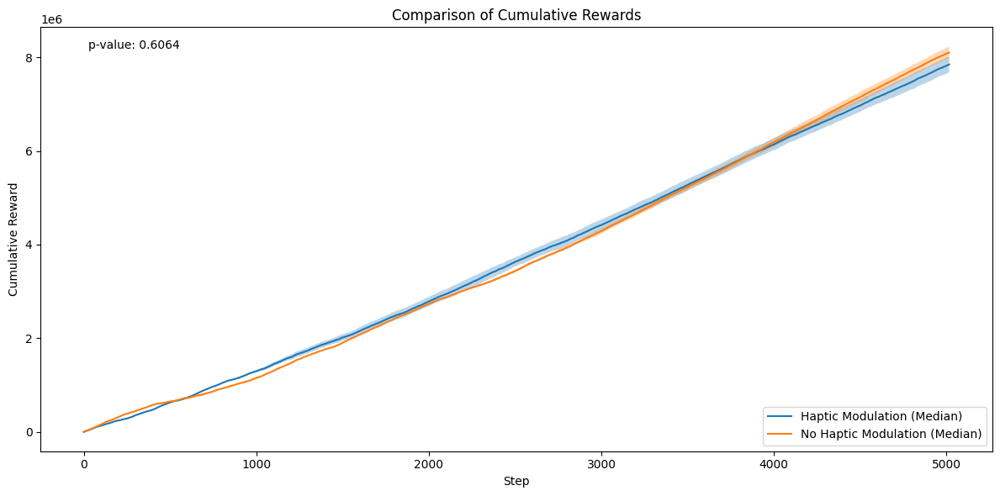

In [52]:

def compare_cumulative_rewards(df1, df2, model1_name, model2_name, output_path):
    """
    Compare cumulative rewards between two models.
    
    :param df1: DataFrame for model 1
    :param df2: DataFrame for model 2
    :param model1_name: Name of model 1 for the legend
    :param model2_name: Name of model 2 for the legend
    :param output_path: Path to save the output plot
    """
    
    def process_dataframe(df):
        # Sort the dataframe by agent and time
        df_sorted = df.sort_values(['agent', 't'])
        
        # Calculate cumulative sum of rewards for each agent
        df_sorted['cumulative_reward'] = df_sorted.groupby('agent')['r'].cumsum()
        
        # Create a step column (index within each agent group)
        df_sorted['step'] = df_sorted.groupby('agent').cumcount()
        
        # Calculate statistics across agents for each step
        stats = df_sorted.groupby('step').agg({
            'cumulative_reward': [
                ('median', 'median'),
                ('ci_lower', lambda x: np.percentile(x, 2.5)),
                ('ci_upper', lambda x: np.percentile(x, 97.5))
            ]
        })
        
        stats.columns = stats.columns.droplevel()  # Flatten multi-index columns
        return stats
    
    stats1 = process_dataframe(df1)
    stats2 = process_dataframe(df2)
    
    # Plotting
    plt.figure(figsize=(12, 6))
    
    plt.plot(stats1.index, stats1['median'], label=f'{model1_name} (Median)')
    plt.fill_between(stats1.index, stats1['ci_lower'], stats1['ci_upper'], alpha=0.3)
    
    plt.plot(stats2.index, stats2['median'], label=f'{model2_name} (Median)')
    plt.fill_between(stats2.index, stats2['ci_lower'], stats2['ci_upper'], alpha=0.3)
    
    plt.title('Comparison of Cumulative Rewards')
    plt.xlabel('Step')
    plt.ylabel('Cumulative Reward')
    plt.legend()
    
    # Perform statistical test
    min_length = min(len(stats1), len(stats2))
    _, p_value = sci_stats.ttest_ind(stats1['median'][:min_length], stats2['median'][:min_length])
    plt.text(0.05, 0.95, f'p-value: {p_value:.4f}', transform=plt.gca().transAxes)
    
    plt.tight_layout()
    plt.savefig(output_path)

    
    print(f"Plot saved to {output_path}")
    print(f"p-value of difference: {p_value:.4f}")

# Example usage:
compare_cumulative_rewards(df, df_no_effect, 'Haptic Modulation', 'No Haptic Modulation', './cumulative_rewards_comparison.png')

In [95]:
fig_raw_no_effect, fig_norm_no_effect = plot_metrics(df_no_effect, stats)
fig_raw_no_effect.show()
fig_norm_no_effect.show()

REWARDS ANALYSIS



In [91]:
def analyze_rewards(df, window_size):
    df = df.rename(columns={'r': 'rewards'})
    fig = make_subplots(rows=2, cols=1, subplot_titles=('Rewards Over Time', 'Cumulative Rewards Over Time'))
    colors = {'pursuer_0': 'blue', 'pursuer_1': 'red'}
    
    reward_stats = {}
    
    for agent in df['agent'].unique():
        agent_data = df[df['agent'] == agent]
        
        # Plot raw rewards
        fig.add_trace(go.Scatter(x=agent_data['t'], y=agent_data['rewards'], mode='lines', name=f'{agent} Reward', line=dict(color=colors[agent])), row=1, col=1)
        
        # Calculate and plot cumulative rewards
        cumulative_rewards = agent_data['rewards'].cumsum()
        fig.add_trace(go.Scatter(x=agent_data['t'], y=cumulative_rewards, mode='lines', name=f'{agent} Cumulative Reward', line=dict(color=colors[agent])), row=2, col=1)
        
        # Calculate rolling statistics
        reward_mean = agent_data['rewards'].rolling(window=window_size).mean()
        reward_std = agent_data['rewards'].rolling(window=window_size).std()
        reward_min = agent_data['rewards'].rolling(window=window_size).min()
        reward_max = agent_data['rewards'].rolling(window=window_size).max()
        
        # Plot rolling mean
        fig.add_trace(go.Scatter(x=agent_data['t'], y=reward_mean, mode='lines', name=f'{agent} Reward Mean', line=dict(dash='dash', color=colors[agent])), row=1, col=1)
        
        # Store statistics
        reward_stats[agent] = {
            'mean': agent_data['rewards'].mean(),
            'std': agent_data['rewards'].std(),
            'min': agent_data['rewards'].min(),
            'max': agent_data['rewards'].max(),
            'total': agent_data['rewards'].sum(),
            'rolling_mean': reward_mean,
            'rolling_std': reward_std,
            'rolling_min': reward_min,
            'rolling_max': reward_max
        }
    
    fig.update_layout(height=800, width=1000, title_text="Reward Analysis")
    fig.update_xaxes(title_text="Time", row=2, col=1)
    fig.update_yaxes(title_text="Reward", row=1, col=1)
    fig.update_yaxes(title_text="Cumulative Reward", row=2, col=1)
    
    return fig, reward_stats

In [93]:
fig_rewards_no_effect, reward_stats_no_effect = analyze_rewards(df_no_effect, window_size)
fig_rewards_no_effect.write_html(os.path.join(log_dir, 'reward_analysis_plot.html'))


In [94]:
fig_rewards_no_effect